In [1]:
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns


In [2]:
df = pd.read_csv("states.csv")
df.head()

,Date,State,Confirmed,Recovered,Deceased,Other,Tested
0,2020-01-30,Kerala,1,0,0,0,NaN
1,2020-01-30,India,1,0,0,0,NaN
2,2020-02-02,Kerala,2,0,0,0,NaN
3,2020-02-02,India,2,0,0,0,NaN
4,2020-02-03,Kerala,3,0,0,0,NaN


In [3]:
df.tail()

,Date,State,Confirmed,Recovered,Deceased,Other,Tested
14982,2021-05-03,Tripura,35720,33725,396,23,717664.0
14983,2021-05-03,India,20275632,16600852,222386,8770,291647037.0
14984,2021-05-03,Uttar Pradesh,1342413,1043134,13447,0,41591659.0
14985,2021-05-03,Uttarakhand,197023,134488,2930,4169,3874678.0
14986,2021-05-03,West Bengal,880894,749296,11637,0,10600346.0


In [4]:
df['Date'] = pd.to_datetime(df['Date'], format='%Y-%m-%d')

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14987 entries, 0 to 14986
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   Date       14987 non-null  datetime64[ns]
 1   State      14987 non-null  object        
 2   Confirmed  14987 non-null  int64         
 3   Recovered  14987 non-null  int64         
 4   Deceased   14987 non-null  int64         
 5   Other      14987 non-null  int64         
 6   Tested     14224 non-null  float64       
dtypes: datetime64[ns](1), float64(1), int64(4), object(1)
memory usage: 819.7+ KB


In [6]:
#using pandas library to find out total confirmed cases
#likewise we can calculate total deaths and recovered 
Total_confirmed_cases=df['Confirmed'].sum()
print('Total number of confirmed cases till today:',Total_confirmed_cases)

Total number of confirmed cases till today: 5163621124


In [7]:
df.drop('Other', inplace=True,axis=1)

In [8]:
df.drop('Tested', inplace=True,axis=1)

In [9]:
#Dropping rows containing India 
index_names = df[ df['State'] == 'India'].index
df.drop(index_names, inplace = True)

In [10]:
#using gradient visualisation (just to get an idea how the syntax is )
df.style.background_gradient(cmap='Reds')

In [11]:
df.State.unique()#we can see that India is not there anymore.. 
#and weird names for the states are also not present which means our data is consistent 

array(['Kerala', 'Delhi', 'Telangana', 'Rajasthan', 'Haryana',
       'Uttar Pradesh', 'Ladakh', 'Tamil Nadu', 'Jammu and Kashmir',
       'Karnataka', 'Maharashtra', 'Punjab', 'Andhra Pradesh',
       'Himachal Pradesh', 'Uttarakhand', 'Odisha', 'Puducherry',
       'West Bengal', 'Chandigarh', 'Chhattisgarh', 'Gujarat',
       'Madhya Pradesh', 'Bihar', 'Manipur', 'Goa', 'Mizoram',
       'Andaman and Nicobar Islands', 'Assam', 'Jharkhand',
       'Arunachal Pradesh', 'Nagaland', 'Tripura',
       'Dadra and Nagar Haveli and Daman and Diu', 'Meghalaya', 'Sikkim',
       'State Unassigned', 'Lakshadweep'], dtype=object)

In [12]:
#we extracting df1 to see the bigger picture of all the cases till now statewise which was otherwise available as date wise 
#merging the rows together
df1=df.groupby(['State']).sum()



In [13]:
#creating a different csv files
df1.to_csv('state_wise.csv', encoding='utf-8')

In [14]:
#we can see that Maharashtra has the most number of cases(the population is also high there)
#Andhra Pradesh seems to have more cases than Delhi
#gradient map provides a relative idea about the data 
df1.style.background_gradient(cmap='Reds')

,Confirmed,Recovered,Deceased
State,,,
Andaman and Nicobar Islands,1225923,1156968,15530
Andhra Pradesh,217471802,205559241,1770718
Arunachal Pradesh,3782248,3523930,11463
Assam,53835653,50282057,245417
Bihar,64476470,60206740,354197
Chandigarh,4949847,4477635,72677
Chhattisgarh,67755981,59982454,782856
Dadra and Nagar Haveli and Daman and Diu,945285,867092,632
Delhi,146924754,137112624,2568896


In [15]:
#having a look at state wise csv 
df2 = pd.read_csv("state_wise.csv")
df2.head()

,State,Confirmed,Recovered,Deceased
0,Andaman and Nicobar Islands,1225923,1156968,15530
1,Andhra Pradesh,217471802,205559241,1770718
2,Arunachal Pradesh,3782248,3523930,11463
3,Assam,53835653,50282057,245417
4,Bihar,64476470,60206740,354197


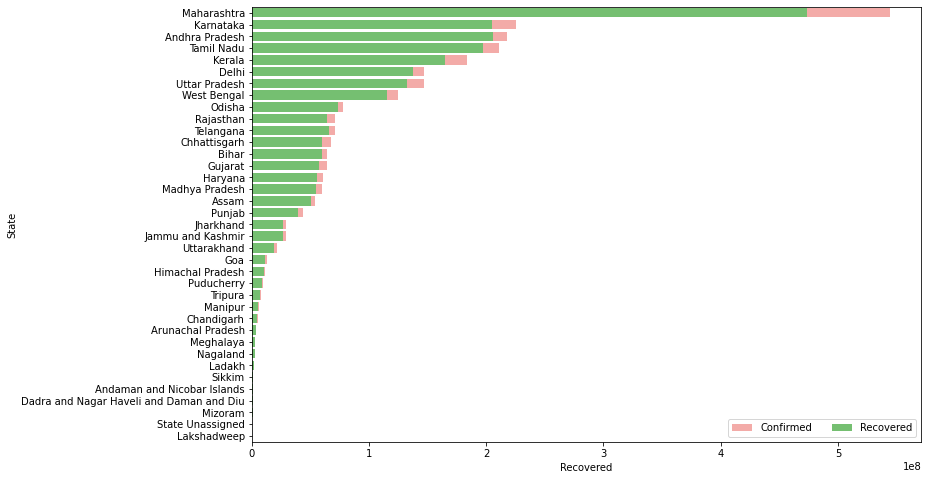

In [16]:
#plotting relative graph wrt to confirmed and recovered
f,ax=plt.subplots(figsize=(12,8))
data=df2[['State','Confirmed','Recovered','Deceased']]
data.sort_values('Confirmed',ascending=False,inplace=True)
sns.set_color_codes("pastel")
sns.barplot(x="Confirmed",y="State",data=data,label="Confirmed",color="r")#till here we will get horizontal bargraph of one column

sns.set_color_codes("muted")
sns.barplot(x="Recovered",y="State",data=data,label="Recovered",color="g") #we get 2 columns on graph 

ax.legend(ncol=2,loc='lower right',frameon=True)
